# Make hex Difference Maps

In [1]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
import scipy.stats
import matplotlib
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.dates as mdates
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
from astropy.time import Time
import datetime
import rioxarray as rxr
from rasterio.plot import show
import rasterio as rio
from rasterio import features
import hvplot.pandas
import pickle
#from holoviews.element.tiles import EsriImagery, StamenTerrain
from geoviews import opts, tile_sources as gvts
#from imview.lib import pltlib

In [2]:
%matplotlib inline

In [3]:
plt.rcParams['figure.facecolor']='w'
plt.rcParams['axes.facecolor']='w'
plt.rcParams['savefig.facecolor']='w'

plt.rcParams['font.size'] = '12'

In [4]:
pd.set_option('display.max_columns', None)

## Load in the Data:

In [15]:
atl06sr_gdf = pickle.load(open('../../../data/atl06/methow_all_sr-atl06-10172022_processed.pkl', 'rb'))

outline_gdf = pickle.load(open('../../../data/site_outlines/methow_outline_32610.pkl', 'rb'))

snwd = pickle.load(open('../../data/snotel/snotel_snwd_35.pkl', 'rb'))

cdec_geom = pickle.load(open('../../data/snotel/snotel_geometries.pkl', 'rb'))

streamlines_methow = pickle.load(open('../../../data/site_outlines/streamlines_methow.pkl', 'rb'))

In [6]:
cdec_geom[0:1].geometry.distance(outline_gdf)

/Users/Hannah/opt/miniconda3/envs/analysis_2022/lib/python3.8/site-packages/geopandas/base.py:31: UserWarning: The indices of the two GeoSeries are different.
  warn("The indices of the two GeoSeries are different.")


0   NaN
3   NaN
dtype: float64

In [7]:
cdec_geom[0:1]

,code,name,network,elevation_m,site_property,geometry,elevation_transformed,site
0,1259_WA_SNTL,Muckamuck,SNOTEL,1362.456055,"{'county': 'Okanogan', 'state': 'Washington', ...",POINT (731093.784 5386094.282),1362.456055,NaN


In [22]:
# get the shapely object, not a GeoSeries
geom = cdec_geom[0:1].geometry.item()

# apply distance from a GeoSeries to the single shapely object
dist=outline_gdf.boundary.distance(geom)

In [23]:
dist

3    4907.875423
dtype: float64

In [24]:
# get the shapely object, not a GeoSeries
geom = cdec_geom[1:2].geometry.item()

# apply distance from a GeoSeries to the single shapely object
outline_gdf.boundary.distance(geom)

3    5996.132033
dtype: float64

In [8]:
methow_reverse = gpd.read_file('../../../data/site_outlines/methow_reverse.geojson')

In [15]:
methow_reverse = methow_reverse.to_crs('epsg:32610')

In [16]:
methow_reverse = gpd.overlay(methow_reverse, outline_gdf, how='difference')

<AxesSubplot: >

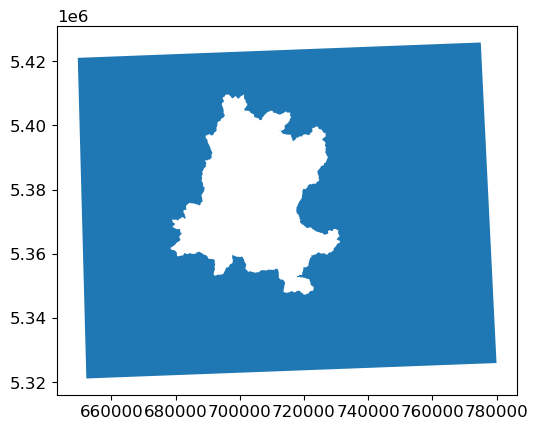

In [17]:
methow_reverse.plot()

In [ ]:
# Save the reverse geodataframe
out_fn = '../../../data/site_outlines/methow_reverse.pkl'

with open(out_fn, 'wb') as f:
    pickle.dump(methow_reverse, f)

In [9]:
methow_reverse = pickle.load(open('../../../data/site_outlines/methow_reverse.pkl', 'rb'))

## Filter Outliers  
Using David's code  
Less concerned about doing this since I use the Median in my anayses

In [19]:
atl06sr_gdf[atl06sr_gdf['snow_presence']==0]['zscore']

time
2018-11-09 22:09:43.662511060         NaN
2018-11-09 22:09:43.789049908   -0.667243
2018-11-09 22:09:43.794872008   -1.058617
2018-11-09 22:09:43.797684372    0.038892
2018-11-09 22:09:43.800494952   -0.821921
                                   ...   
2022-06-06 07:54:57.627617920    0.702751
2022-06-06 07:54:57.630443216    2.008366
2022-06-06 07:54:57.902096240   -6.307906
2022-06-06 07:54:57.904934768    2.949443
2022-06-06 07:54:57.907769088    0.606011
Name: zscore, Length: 80977, dtype: float64

In [6]:
atl06sr_gdf.loc[atl06sr_gdf['snow_presence']==0,'zscore'] = (atl06sr_gdf.loc[atl06sr_gdf['snow_presence']==0,'diff_plus'] - atl06sr_gdf.loc[atl06sr_gdf['snow_presence']==0,'diff_plus'].mean()) / atl06sr_gdf.loc[atl06sr_gdf['snow_presence']==0,'diff_plus'].std()

atl06sr_gdf.loc[atl06sr_gdf['snow_presence']==1,'zscore'] = (atl06sr_gdf.loc[atl06sr_gdf['snow_presence']==1,'diff_plus'] - atl06sr_gdf.loc[atl06sr_gdf['snow_presence']==1,'diff_plus'].mean()) / atl06sr_gdf.loc[atl06sr_gdf['snow_presence']==1,'diff_plus'].std()


In [21]:
atl06sr_gdf['zscore']

time
2018-11-09 22:09:43.662511060         NaN
2018-11-09 22:09:43.789049908   -0.611191
2018-11-09 22:09:43.794872008   -1.006212
2018-11-09 22:09:43.797684372    0.101524
2018-11-09 22:09:43.800494952   -0.767310
                                   ...   
2022-06-06 07:54:57.627617920    0.771569
2022-06-06 07:54:57.630443216    2.089351
2022-06-06 07:54:57.902096240   -6.304414
2022-06-06 07:54:57.904934768    3.039196
2022-06-06 07:54:57.907769088    0.673928
Name: zscore, Length: 148886, dtype: float64

In [22]:
atl06sr_gdf.zscore.describe()

/Users/Hannah/opt/miniconda3/envs/analysis_2022/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(


count    1.466470e+05
mean    -2.228819e-17
std      9.999966e-01
min     -1.763625e+01
25%     -4.165015e-01
50%      1.312209e-01
75%      5.012069e-01
max      1.328437e+01
Name: zscore, dtype: float64

In [11]:
atl06sr_gdf.head()

,pflags,h_mean,dh_fit_dy,spot,w_surface_window_final,h_sigma,distance,segment_id,dh_fit_dx,rgt,cycle,delta_time,gt,n_fit_photons,rms_misfit,geometry,acqdate,doy,decyear,dowy,snow_presence,lidar_z,difference,lidar_z_20m,difference_20m,slope_3m,slope_20m,slope_100m,diff_plus,diff_plus_20m,zscore,n,diff_plus_lowslope
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43.662511060,0,774.110259,0.0,5,9.386548,0.079705,5.382001e+06,268398,0.367318,646,1,2.703658e+07,20,41,0.506044,POINT (722265.057 5358346.501),2018-11-09,313,2018.857324,40,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1468.0,NaN
2018-11-09 22:09:43.789049908,0,919.941824,0.0,5,3.000000,0.050617,5.382903e+06,268443,0.028568,646,1,2.703658e+07,20,42,0.305572,POINT (722145.580 5359238.959),2018-11-09,313,2018.857324,40,0,921.263184,-1.321359,924.401428,-4.459604,21.903059,11.596403,NaN,-0.881577,-4.024133,-0.667243,1468.0,-0.968813
2018-11-09 22:09:43.794872008,0,918.460968,0.0,5,3.029108,0.046853,5.382943e+06,268445,-0.116342,646,1,2.703658e+07,20,31,0.240537,POINT (722140.182 5359280.079),2018-11-09,313,2018.857324,40,0,920.253967,-1.792999,916.323120,2.137848,20.189816,19.377096,17.052359,-1.353217,2.573319,-1.058617,1468.0,-1.440454
2018-11-09 22:09:43.797684372,0,916.399163,0.0,5,3.000000,0.059160,5.382963e+06,268446,-0.091024,646,1,2.703658e+07,20,39,0.325805,POINT (722137.582 5359299.951),2018-11-09,313,2018.857324,40,0,916.869568,-0.470405,916.078796,0.320367,10.068434,15.654634,17.052359,-0.030623,0.755838,0.038892,1468.0,-0.117859
2018-11-09 22:09:43.800494952,0,915.721672,0.0,5,3.000000,0.038990,5.382983e+06,268447,-0.027886,646,1,2.703658e+07,20,40,0.245902,POINT (722134.962 5359319.820),2018-11-09,313,2018.857324,40,0,917.229431,-1.507760,916.709717,-0.988045,7.963524,12.223098,17.052359,-1.067977,-0.552574,-0.821921,1468.0,-1.155214


In [12]:
zscore_thresh = 3
absdiff_thresh = 5.0

atl06_idx = (atl06sr_gdf['zscore'].abs() <= zscore_thresh) & (atl06sr_gdf['diff_plus'].abs() <= absdiff_thresh)

inner_snowoff_idx = (atl06sr_gdf['zscore'].abs() <= zscore_thresh) & \
    (atl06sr_gdf['diff_plus'].abs() <= absdiff_thresh) & \
    (atl06sr_gdf['snow_presence'] == 0)

inner_snowon_idx = (atl06sr_gdf['zscore'].abs() <= zscore_thresh) & \
    (atl06sr_gdf['diff_plus'].abs() <= absdiff_thresh) & \
    (atl06sr_gdf['snow_presence'] == 1)

### Create the hex map using code from GDA 2021

<AxesSubplot: >

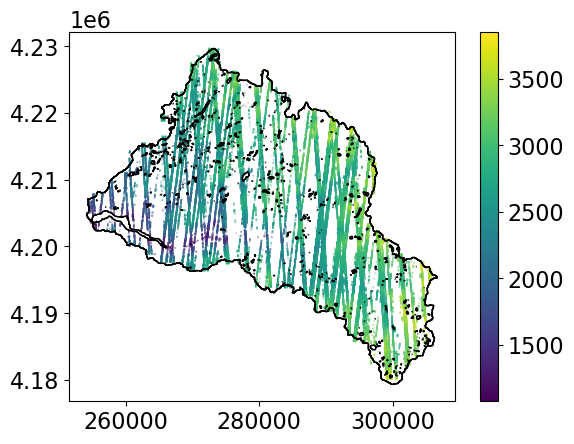

In [28]:
fig, ax = plt.subplots()

atl06sr_gdf.plot(ax=ax, column='h_mean', markersize=0.01, legend=True)
outline_nolakes.plot(ax=ax, facecolor='none')

<AxesSubplot: >

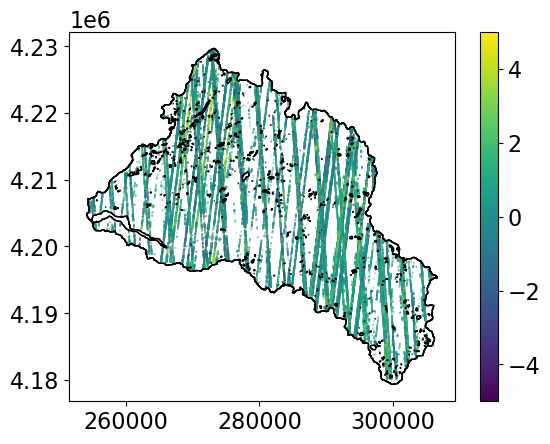

In [38]:
fig, ax = plt.subplots()

atl06sr_gdf[atl06_idx].plot(ax=ax, column='diff_plus', markersize=0.01, legend=True)
outline_nolakes.plot(ax=ax, facecolor='none')

Text(0.5, 1.0, 'ATL06SR Snow On - DEM')

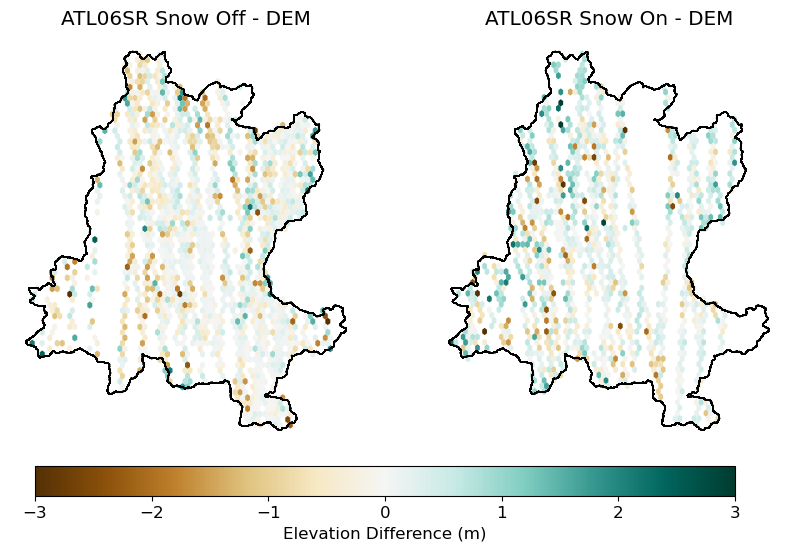

In [39]:
fig, ax = plt.subplots(1,2, figsize=(10,10))

hb_off = ax[0].hexbin(atl06sr_gdf[inner_snowoff_idx].geometry.x, 
               atl06sr_gdf[inner_snowoff_idx].geometry.y, 
               C=atl06sr_gdf[inner_snowoff_idx]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, vmin=-3, vmax=3, edgecolors='none')

hb_on = ax[1].hexbin(atl06sr_gdf[inner_snowon_idx].geometry.x, 
               atl06sr_gdf[inner_snowon_idx].geometry.y, 
               C=atl06sr_gdf[inner_snowon_idx]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, vmin=-3, vmax=3, edgecolors='none')

outline_gdf.plot(ax=ax[0], facecolor='none', edgecolor='k')
outline_gdf.plot(ax=ax[1], facecolor='none', edgecolor='k')

for axis in ax:
    axis.set_axis_off()

# https://stackoverflow.com/questions/13784201/how-to-have-one-colorbar-for-all-subplots
fig.subplots_adjust(top=0.8)
cbar_ax = fig.add_axes([0.15, 0.2, 0.7, 0.03])
plt.colorbar(hb_on, cax=cbar_ax, label='Elevation Difference (m)', orientation='horizontal')

#plt.tight_layout()
ax[0].set_title('ATL06SR Snow Off - DEM')
ax[1].set_title('ATL06SR Snow On - DEM')

Text(0.5, 1.0, 'ATL06SR Snow On - DEM')

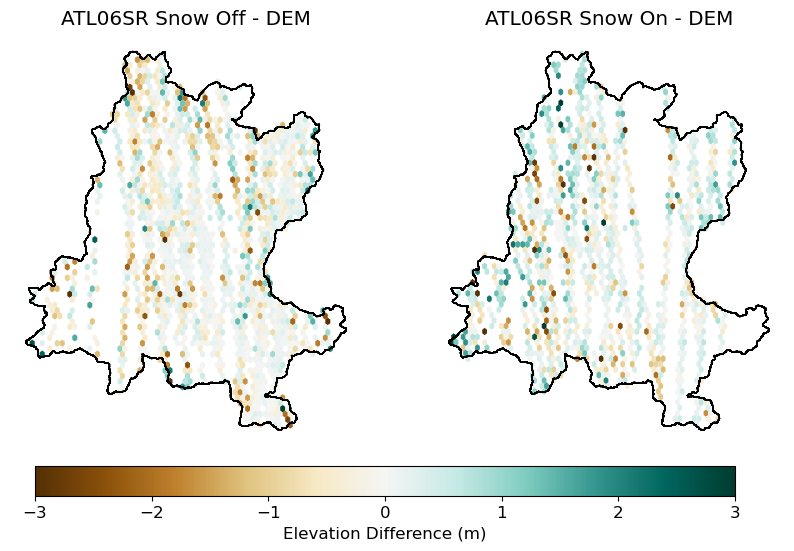

In [38]:
fig, ax = plt.subplots(1,2, figsize=(10,10))

hb_off = ax[0].hexbin(atl06sr_gdf[atl06sr_gdf['snow_presence']==0].geometry.x, 
               atl06sr_gdf[atl06sr_gdf['snow_presence']==0].geometry.y, 
               C=atl06sr_gdf[atl06sr_gdf['snow_presence']==0]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, vmin=-3, vmax=3, edgecolors='none')

hb_on = ax[1].hexbin(atl06sr_gdf[atl06sr_gdf['snow_presence']==1].geometry.x, 
               atl06sr_gdf[atl06sr_gdf['snow_presence']==1].geometry.y, 
               C=atl06sr_gdf[atl06sr_gdf['snow_presence']==1]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, vmin=-3, vmax=3, edgecolors='none')

outline_gdf.plot(ax=ax[0], facecolor='none', edgecolor='k')
outline_gdf.plot(ax=ax[1], facecolor='none', edgecolor='k')

for axis in ax:
    axis.set_axis_off()

# https://stackoverflow.com/questions/13784201/how-to-have-one-colorbar-for-all-subplots
fig.subplots_adjust(top=0.8)
cbar_ax = fig.add_axes([0.15, 0.2, 0.7, 0.03])
plt.colorbar(hb_on, cax=cbar_ax, label='Elevation Difference (m)', orientation='horizontal')

#plt.tight_layout()
ax[0].set_title('ATL06SR Snow Off - DEM')
ax[1].set_title('ATL06SR Snow On - DEM')

In [100]:
cmap(0)

(0.32941176470588235, 0.18823529411764706, 0.0196078431372549, 1.0)

In [102]:
cmap(1000)

(0.0, 0.23529411764705882, 0.18823529411764706, 1.0)

In [116]:
!pwd

/Users/Hannah/Documents/Documents_Grad/Research/IDS_westernUS/SlideRule_tuolumne/notebooks/figure_production


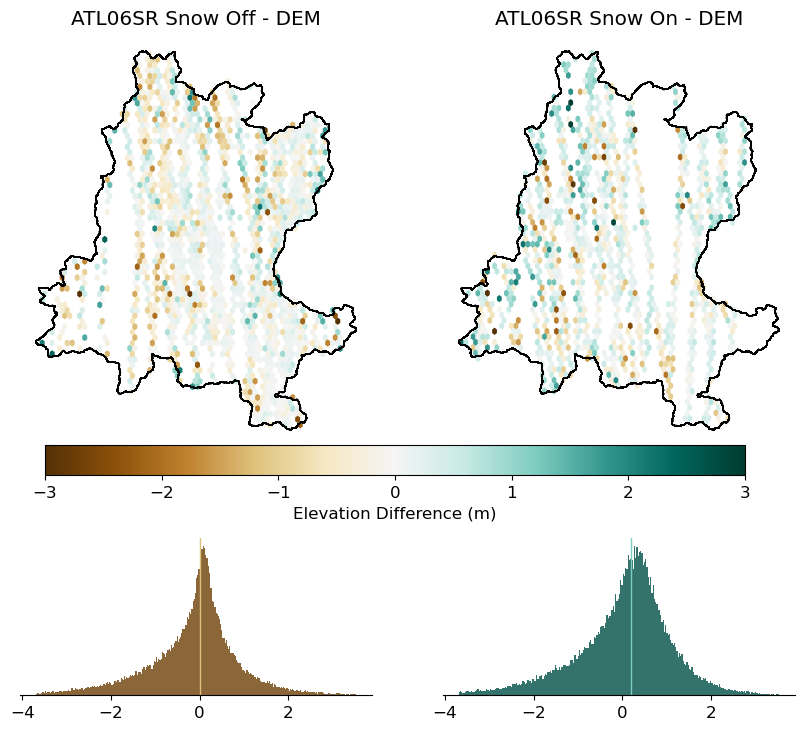

In [41]:
# add histograms to difference plots
norm = matplotlib.colors.Normalize(vmin=-5, vmax=5)
cmap = matplotlib.cm.get_cmap('BrBG')

fig, ax = plt.subplots(2,2, figsize=(10,10), gridspec_kw={'height_ratios': [3, 1], 'width_ratios': [1,1]})

hb_off = ax[0,0].hexbin(atl06sr_gdf[inner_snowoff_idx].geometry.x, 
               atl06sr_gdf[inner_snowoff_idx].geometry.y, 
               C=atl06sr_gdf[inner_snowoff_idx]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, vmin=-3, vmax=3, edgecolors='none')
ax[0,0].set_axis_off()

hb_on = ax[0,1].hexbin(atl06sr_gdf[inner_snowon_idx].geometry.x, 
               atl06sr_gdf[inner_snowon_idx].geometry.y, 
               C=atl06sr_gdf[inner_snowon_idx]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, edgecolors='none', vmin=-3, vmax=3)
ax[0,1].set_axis_off()

outline_gdf.plot(ax=ax[0,0], facecolor='none', edgecolor='k')
outline_gdf.plot(ax=ax[0,1], facecolor='none', edgecolor='k')

ax[1,0].hist(atl06sr_gdf[inner_snowoff_idx]['diff_plus'], color=cmap(norm(-4.5)),\
            bins=int(np.sqrt(len(atl06sr_gdf[inner_snowoff_idx]))), alpha=0.8)
ax[1,0].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), c=cmap(norm(-2)), linewidth=1)
#ax[1,0].set_xlabel('Snowoff Elevation Differences (m)')
# Hide the right and top spines
ax[1,0].spines.right.set_visible(False)
ax[1,0].spines.top.set_visible(False)
ax[1,0].spines.left.set_visible(False)
ax[1,0].axes.yaxis.set_visible(False)

ax[1,1].hist(atl06sr_gdf[inner_snowon_idx]['diff_plus'], color=cmap(norm(4.5)),\
            bins=int(np.sqrt(len(atl06sr_gdf[inner_snowon_idx]))), alpha=0.8)
ax[1,1].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowon_idx]['diff_plus']), c=cmap(norm(2)), linewidth=1)
#ax[1,1].set_xlabel('Snow On Elevation Differences (m)')
ax[1,1].spines.right.set_visible(False)
ax[1,1].spines.top.set_visible(False)
ax[1,1].spines.left.set_visible(False)
ax[1,1].axes.yaxis.set_visible(False)

# https://stackoverflow.com/questions/13784201/how-to-have-one-colorbar-for-all-subplots
fig.subplots_adjust(top=0.8)
cbar_ax = fig.add_axes([0.15, 0.33, 0.7, 0.03])
plt.colorbar(hb_on, cax=cbar_ax, label='Elevation Difference (m)', orientation='horizontal')

#plt.tight_layout()
ax[0,0].set_title('ATL06SR Snow Off - DEM')
ax[0,1].set_title('ATL06SR Snow On - DEM')

plt.savefig('../../figures/polished/difference_map_hist.jpeg', dpi=500)

## Add another Row with Hillshade and other characteristics

In [13]:
hillshade = rxr.open_rasterio('../../../data/lidar/methow/dtm/methow_basin_2018_dtm_combined_32610_100m_hillshade.tif', masked=True).squeeze()
#chm = rxr.open_rasterio('../../../data/lidar/tuolumne/chm/USCATB20140827_chm_3p0m_ma_100m.tif', masked=True).squeeze()

In [45]:
import fiona
fiona.listlayers('../../../data/misc/ECY_WAT_NHDWAMajor.gdb')

['ECY_WAT_NHDWAMajor_NHDWaterbodies',
 'ECY_WAT_NHDWAMajor_NHDAreas',
 'ECY_WAT_NHDWAMajor_NHDStreams']

In [7]:
# from: https://data.cnra.ca.gov/dataset/nhd-major-features

streamlines = gpd.read_file('../../../data/misc/ECY_WAT_NHDWAMajor.gdb', layer=2)

In [8]:
streamlines.head()

,Permanent_Identifier,FDate,Resolution,GNIS_ID,GNIS_Name,LengthKM,ReachCode,FlowDir,WBArea_Permanent_Identifier,FType,FCode,MainPath,InNetwork,VisibilityFilter,Enabled,StreamOrder,Shape_Length,geometry
0,52126979,2012-07-19 08:55:58+00:00,2,00388087,Pack River,0.864,17010214000116,1,52133255,558,55800,0,1,5000000,1,4,2837.510935,MULTILINESTRING Z ((2599404.159 1163012.723 0....
1,52126999,2012-07-19 08:55:58+00:00,2,00388087,Pack River,0.228,17010214000116,1,52133255,558,55800,0,1,5000000,1,4,750.328154,MULTILINESTRING Z ((2601051.799 1161992.772 0....
2,52126823,2012-07-19 08:56:26+00:00,2,00388087,Pack River,0.623,17010214000117,1,52133255,558,55800,0,1,5000000,1,4,2045.852427,MULTILINESTRING Z ((2597523.278 1170352.287 0....
3,52127021,2012-07-19 08:55:58+00:00,2,00388087,Pack River,0.397,17010214000116,1,52133255,558,55800,0,1,5000000,1,4,1308.102196,MULTILINESTRING Z ((2601514.764 1161472.995 0....
4,52127033,2012-07-19 08:57:09+00:00,2,00388087,Pack River,0.148,17010214000115,1,52133255,558,55800,0,1,5000000,1,4,486.297368,MULTILINESTRING Z ((2601662.588 1160419.352 0....


<AxesSubplot: >

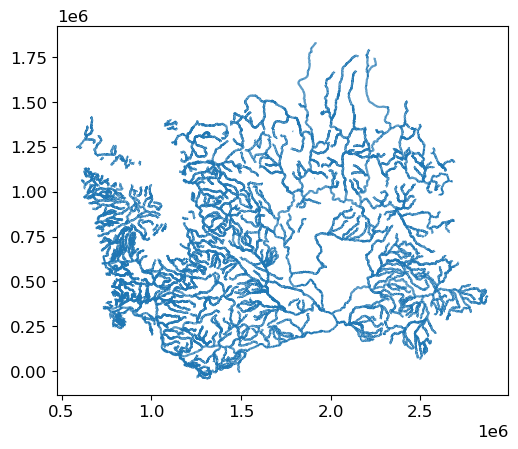

In [48]:
streamlines.plot()

In [14]:
dtm = rxr.open_rasterio('../../../data/lidar/methow/dtm/methow_basin_2018_dtm_combined_32610_100m.tif', masked=True).squeeze()

In [14]:
streamlines = streamlines.to_crs('epsg:32610')

In [15]:
streamlines_methow = gpd.clip(streamlines, outline_gdf)

/Users/Hannah/opt/miniconda3/envs/analysis_2022/lib/python3.8/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


In [16]:
# Save the reverse geodataframe
out_fn = '../../../data/site_outlines/streamlines_methow.pkl'

with open(out_fn, 'wb') as f:
    pickle.dump(streamlines_methow, f)

<AxesSubplot: >

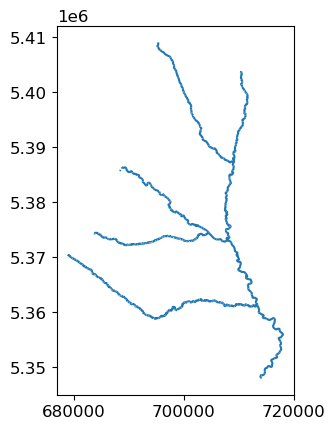

In [10]:
streamlines_methow.plot()

Text(0.5, 1.0, 'Tuolumne All Data')

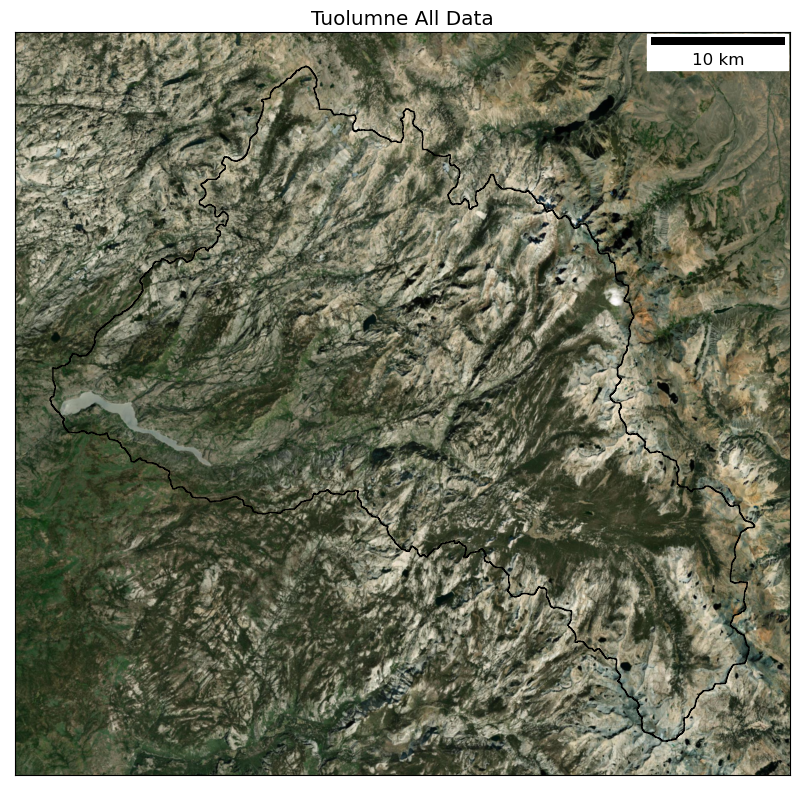

In [180]:
basemap = cx.providers.Esri.WorldImagery
#basemap.update({'time':'2019-09-09'})

f, axa = plt.subplots(figsize=(10,10))
s=10

#atl06sr_gdf.plot(ax=axa, column='diff_plus', cmap='RdBu', legend = False, s=s, vmin = -4, vmax = 4)
outline_gdf.plot(ax=axa, facecolor='none', edgecolor='k')
axa.add_artist(ScaleBar(1))
cx.add_basemap(axa, attribution=False, crs=atl06sr_gdf.crs.to_string(), source=basemap, zoom=12)
axa.axes.xaxis.set_ticks([])
axa.axes.yaxis.set_ticks([])
    
#axa.set_title('Tuolumne All Data')

#plt.savefig('../figures/difmap_alldata.jpeg', dpi=500)

(5347000.0, 5411000.0)

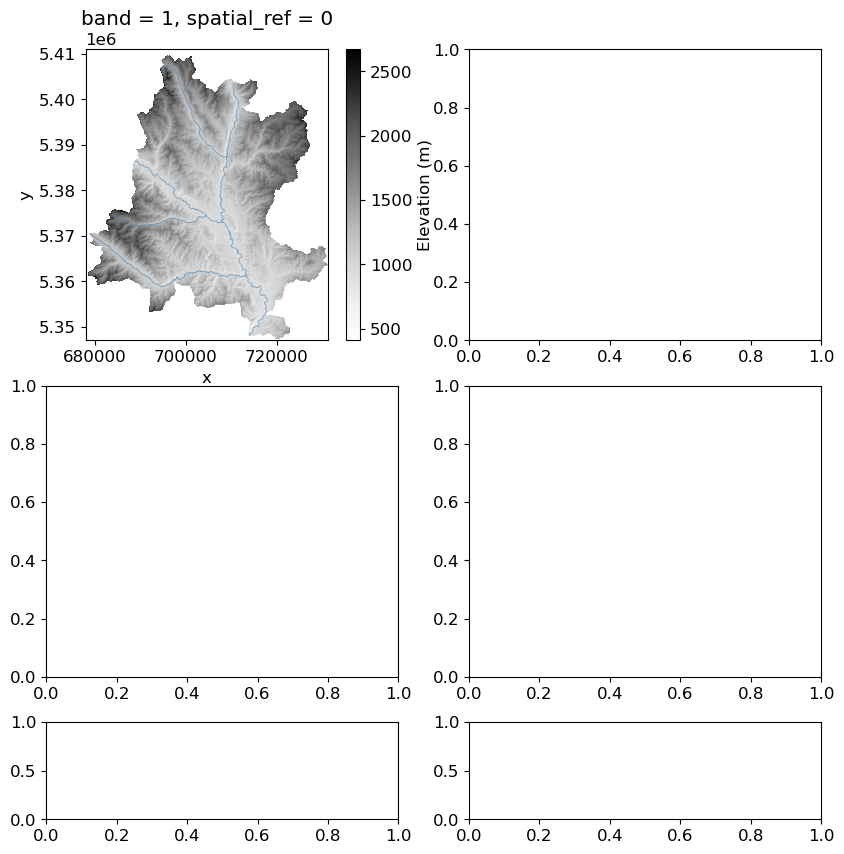

In [64]:
fig, ax = plt.subplots(3,2, figsize=(10,10), gridspec_kw={'height_ratios': [3, 3, 1], 'width_ratios': [1,1]})

c = dtm.plot(cmap='Greys', ax=ax[0,0], add_colorbar=True, cbar_kwargs={'label':'Elevation (m)'})
#chm.plot(cmap='Greens', ax=ax[0,0], add_colorbar=True, vmin=0, vmax=20, cbar_kwargs={'label':'Canopy Height (m)','shrink':0.9}, alpha=0.8)
hillshade.plot(cmap='Greys', ax=ax[0,0], add_colorbar=False, alpha=0.2)
streamlines_methow.plot(ax=ax[0,0], color='steelblue', linewidth=0.5, alpha=0.8)
ax[0,0].set_xlim(678000, 731300)
ax[0,0].set_ylim(5347000, 5411000)
# ax[0,0].set_axis_off()
# ax[0,0].set_title('')
# ax[0,1].set_axis_off()
# ax[0,1].set_title('')

/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_7268/1637341873.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


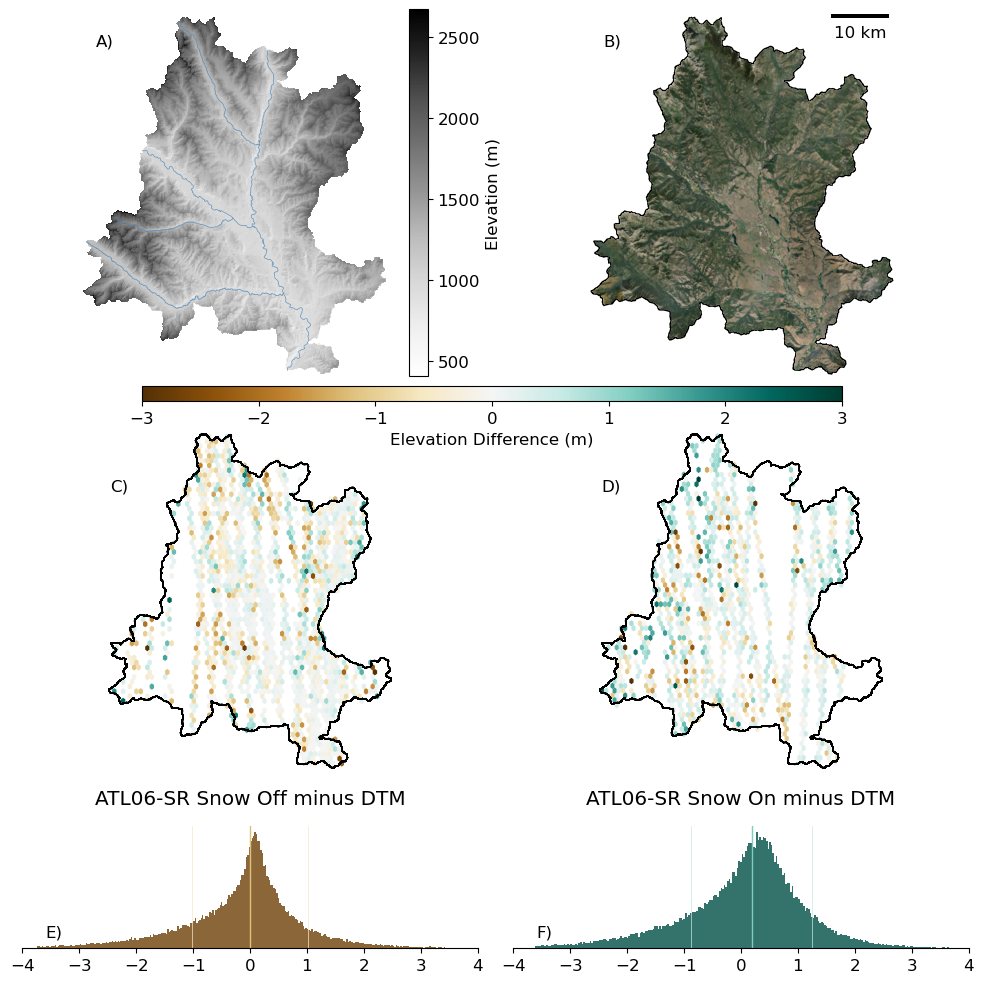

In [15]:
# add histograms to difference plots
basemap = cx.providers.Esri.WorldImagery
norm = matplotlib.colors.Normalize(vmin=-5, vmax=5)
cmap = matplotlib.cm.get_cmap('BrBG')

fig, ax = plt.subplots(3,2, figsize=(10,10), gridspec_kw={'height_ratios': [3, 3, 1], 'width_ratios': [1,1]})

c = dtm.plot(cmap='Greys', ax=ax[0,0], add_colorbar=True, cbar_kwargs={'label':'Elevation (m)'})
#chm.plot(cmap='Greens', ax=ax[0,0], add_colorbar=True, vmin=0, vmax=20, cbar_kwargs={'label':'Canopy Height (m)','shrink':0.9}, alpha=0.8)
hillshade.plot(cmap='Greys', ax=ax[0,0], add_colorbar=False, alpha=0.2)
streamlines_methow.plot(ax=ax[0,0], color='steelblue', linewidth=0.5, alpha=0.8)
ax[0,0].set_xlim(678000, 731300)
ax[0,0].set_ylim(5347000, 5411000)
ax[0,0].set_title('')
ax[0,0].annotate(text='A)', xy=(0.05,0.9), xycoords='axes fraction')
ax[0,0].set_xlabel('')
ax[0,0].set_ylabel('')

ax[0,1].add_artist(ScaleBar(1))
outline_gdf.plot(ax=ax[0,1], facecolor='none', edgecolor='k')
cx.add_basemap(ax[0,1], attribution=False, crs=atl06sr_gdf.crs.to_string(), source=basemap, zoom=12)
methow_reverse.plot(ax=ax[0,1], facecolor='white')
ax[0,1].set_xlim(678000, 731300)
ax[0,1].set_ylim(5347000, 5411000)
# ax[0,1].axes.xaxis.set_ticks([])
# ax[0,1].axes.yaxis.set_ticks([])
ax[0,1].annotate(text='B)', xy=(0.05,0.9), xycoords='axes fraction')
ax[0,1].set_title('')



hb_off = ax[1,0].hexbin(atl06sr_gdf[inner_snowoff_idx].geometry.x, 
               atl06sr_gdf[inner_snowoff_idx].geometry.y, 
               C=atl06sr_gdf[inner_snowoff_idx]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, vmin=-3, vmax=3, edgecolors='none')
ax[1,0].set_axis_off()
ax[1,0].annotate(text='C)', xy=(0.05,0.8), xycoords='axes fraction')
ax[1,0].set_title('ATL06-SR Snow Off minus DTM', y=0, pad=-14)


hb_on = ax[1,1].hexbin(atl06sr_gdf[inner_snowon_idx].geometry.x, 
               atl06sr_gdf[inner_snowon_idx].geometry.y, 
               C=atl06sr_gdf[inner_snowon_idx]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, edgecolors='none', vmin=-3, vmax=3)
ax[1,1].set_axis_off()
ax[1,1].annotate(text='D)', xy=(0.05,0.8), xycoords='axes fraction')

outline_gdf.plot(ax=ax[1,0], facecolor='none', edgecolor='k')
outline_gdf.plot(ax=ax[1,1], facecolor='none', edgecolor='k')
ax[1,1].set_title('ATL06-SR Snow On minus DTM', y=0, pad=-14)


ax[2,0].hist(atl06sr_gdf[inner_snowoff_idx]['diff_plus'], color=cmap(norm(-4.5)),\
            bins=int(np.sqrt(len(atl06sr_gdf[inner_snowoff_idx]))), alpha=0.8)
ax[2,0].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), c=cmap(norm(-2)), linewidth=1)
#add lines for the standard deviation
ax[2,0].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']) + 
                np.nanstd(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), c=cmap(norm(-1)), linewidth=0.5)
ax[2,0].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']) - 
                np.nanstd(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), c=cmap(norm(-1)), linewidth=0.5)
#ax[1,0].set_xlabel('Snowoff Elevation Differences (m)')
# Hide the right and top spines
ax[2,0].spines.right.set_visible(False)
ax[2,0].spines.top.set_visible(False)
ax[2,0].spines.left.set_visible(False)
ax[2,0].axes.yaxis.set_visible(False)
ax[2,0].set_xlim(-4,4)
ax[2,0].annotate(text='E)', xy=(0.05,0.1), xycoords='axes fraction')
# ax[2,0].text(x=np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']) + 
#                 np.nanstd(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), y=0, s='std')
# ax[2,0].text(x=np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), y=0, s='median')

ax[2,1].hist(atl06sr_gdf[inner_snowon_idx]['diff_plus'], color=cmap(norm(4.5)),\
            bins=int(np.sqrt(len(atl06sr_gdf[inner_snowon_idx]))), alpha=0.8)
ax[2,1].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowon_idx]['diff_plus']), c=cmap(norm(2)), linewidth=1)
ax[2,1].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowon_idx]['diff_plus']) + 
                np.nanstd(atl06sr_gdf[inner_snowon_idx]['diff_plus']), c=cmap(norm(1)), linewidth=0.5)
ax[2,1].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowon_idx]['diff_plus']) -
                np.nanstd(atl06sr_gdf[inner_snowon_idx]['diff_plus']), c=cmap(norm(1)), linewidth=0.5)
#ax[1,1].set_xlabel('Snow On Elevation Differences (m)')
ax[2,1].set_xlim(-4,4)
ax[2,1].annotate(text='F)', xy=(0.05,0.1), xycoords='axes fraction')


ax[2,0].spines.right.set_visible(False)
ax[2,0].spines.top.set_visible(False)
ax[2,0].spines.left.set_visible(False)
ax[2,0].axes.yaxis.set_visible(False)

ax[2,1].spines.right.set_visible(False)
ax[2,1].spines.top.set_visible(False)
ax[2,1].spines.left.set_visible(False)
ax[2,1].axes.yaxis.set_visible(False)


ax[0,0].spines['bottom'].set_color('white')
ax[0,0].spines['top'].set_color('white')
ax[0,0].spines['left'].set_color('white')
ax[0,0].spines['right'].set_color('white')
ax[0,0].axes.get_xaxis().set_ticks([])
ax[0,0].axes.get_yaxis().set_ticks([])

ax[0,1].spines['bottom'].set_color('white')
ax[0,1].spines['top'].set_color('white')
ax[0,1].spines['left'].set_color('white')
ax[0,1].spines['right'].set_color('white')
ax[0,1].axes.get_xaxis().set_ticks([])
ax[0,1].axes.get_yaxis().set_ticks([])
        
# https://stackoverflow.com/questions/13784201/how-to-have-one-colorbar-for-all-subplots
fig.subplots_adjust(top=0.8)
cbar_ax = fig.add_axes([.15, 0.59, 0.7, 0.015])
plt.colorbar(hb_on, cax=cbar_ax, label='Elevation Difference (m)', orientation='horizontal')

plt.tight_layout()

plt.savefig('../../figures/polished/difference_map_hist_w-hillshade.jpeg', dpi=500)

/var/folders/yr/1f67jccn6hl_lyxnqy7qjpq40000gp/T/ipykernel_1243/1780647133.py:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


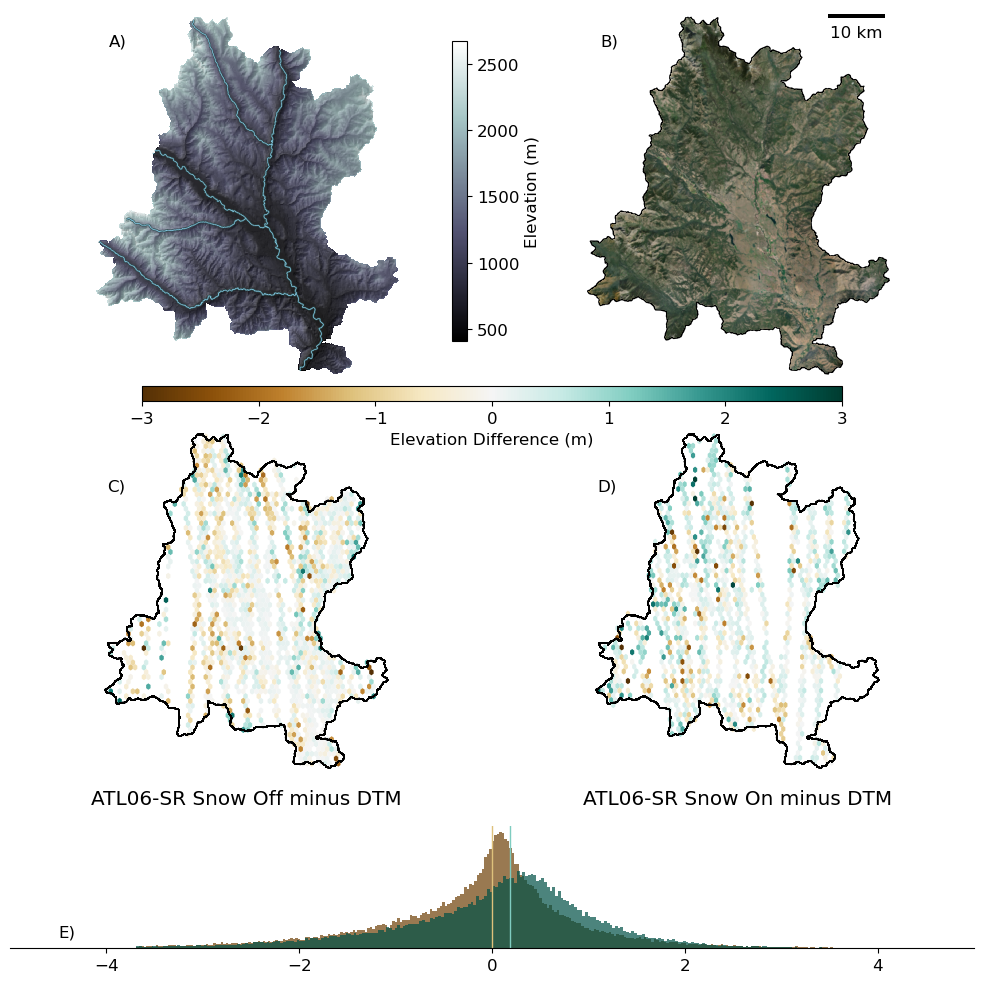

In [20]:
# add histograms to difference plots as a single plot
basemap = cx.providers.Esri.WorldImagery
norm = matplotlib.colors.Normalize(vmin=-5, vmax=5)
cmap = matplotlib.cm.get_cmap('BrBG')

fig, ax = plt.subplot_mosaic([['a', 'b'],
                             ['c', 'd'],
                             ['e', 'e']], figsize=(10,10), gridspec_kw={'height_ratios': [3, 3, 1], 'width_ratios': [1,1]})

c = dtm.plot(cmap='bone', ax=ax['a'], add_colorbar=False) #, cbar_kwargs={'label':'Elevation (m)'}
#chm.plot(cmap='Greens', ax=ax[0,0], add_colorbar=True, vmin=0, vmax=20, cbar_kwargs={'label':'Canopy Height (m)','shrink':0.9}, alpha=0.8)
hillshade.plot(cmap='Greys', ax=ax['a'], add_colorbar=False, alpha=0.3)
streamlines_methow.plot(ax=ax['a'], color='darkslategrey', linewidth=1.5, alpha=0.8)
streamlines_methow.plot(ax=ax['a'], color='skyblue', linewidth=0.5, alpha=1)
ax['a'].set_xlim(678000, 731300)
ax['a'].set_ylim(5347000, 5411000)
ax['a'].set_title('')
ax['a'].annotate(text='A)', xy=(0.05,0.9), xycoords='axes fraction')
ax['a'].set_xlabel('')
ax['a'].set_ylabel('')

ax['b'].add_artist(ScaleBar(1))
outline_gdf.plot(ax=ax['b'], facecolor='none', edgecolor='k')
cx.add_basemap(ax['b'], attribution=False, crs=atl06sr_gdf.crs.to_string(), source=basemap, zoom=12)
methow_reverse.plot(ax=ax['b'], facecolor='white')
ax['b'].set_xlim(678000, 731300)
ax['b'].set_ylim(5347000, 5411000)
# ax[0,1].axes.xaxis.set_ticks([])
# ax[0,1].axes.yaxis.set_ticks([])
ax['b'].annotate(text='B)', xy=(0.05,0.9), xycoords='axes fraction')
ax['b'].set_title('')



hb_off = ax['c'].hexbin(atl06sr_gdf[inner_snowoff_idx].geometry.x, 
               atl06sr_gdf[inner_snowoff_idx].geometry.y, 
               C=atl06sr_gdf[inner_snowoff_idx]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, vmin=-3, vmax=3, edgecolors='none')
ax['c'].set_axis_off()
ax['c'].annotate(text='C)', xy=(0.05,0.8), xycoords='axes fraction')
ax['c'].set_title('ATL06-SR Snow Off minus DTM', y=0, pad=-14)


hb_on = ax['d'].hexbin(atl06sr_gdf[inner_snowon_idx].geometry.x, 
               atl06sr_gdf[inner_snowon_idx].geometry.y, 
               C=atl06sr_gdf[inner_snowon_idx]['diff_plus'], 
               reduce_C_function=np.median, gridsize=60, cmap = 'BrBG', 
               mincnt=0.0001, edgecolors='none', vmin=-3, vmax=3)
ax['d'].set_axis_off()
ax['d'].annotate(text='D)', xy=(0.05,0.8), xycoords='axes fraction')

outline_gdf.plot(ax=ax['c'], facecolor='none', edgecolor='k')
outline_gdf.plot(ax=ax['d'], facecolor='none', edgecolor='k')
ax['d'].set_title('ATL06-SR Snow On minus DTM', y=0, pad=-14)


ax['e'].hist(atl06sr_gdf[inner_snowoff_idx]['diff_plus'], color=cmap(norm(-4.5)),\
            bins=int(np.sqrt(len(atl06sr_gdf[inner_snowoff_idx]))), alpha=0.7)
ax['e'].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), c=cmap(norm(-2)), linewidth=1)
#add lines for the standard deviation
# ax['e'].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']) + 
#                 np.nanstd(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), c=cmap(norm(-1)), linewidth=0.5)
# ax['e'].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']) - 
#                 np.nanstd(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), c=cmap(norm(-1)), linewidth=0.5)
#ax[1,0].set_xlabel('Snowoff Elevation Differences (m)')
# Hide the right and top spines
ax['e'].spines.right.set_visible(False)
ax['e'].spines.top.set_visible(False)
ax['e'].spines.left.set_visible(False)
ax['e'].axes.yaxis.set_visible(False)
ax['e'].set_xlim(-5,5)
ax['e'].annotate(text='E)', xy=(0.05,0.1), xycoords='axes fraction')
# ax[2,0].text(x=np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']) + 
#                 np.nanstd(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), y=0, s='std')
# ax[2,0].text(x=np.nanmedian(atl06sr_gdf[inner_snowoff_idx]['diff_plus']), y=0, s='median')

ax['e'].hist(atl06sr_gdf[inner_snowon_idx]['diff_plus'], color=cmap(norm(4.5)),\
            bins=int(np.sqrt(len(atl06sr_gdf[inner_snowon_idx]))), alpha=0.7)
ax['e'].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowon_idx]['diff_plus']), c=cmap(norm(2)), linewidth=1)
# ax['e'].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowon_idx]['diff_plus']) + 
#                 np.nanstd(atl06sr_gdf[inner_snowon_idx]['diff_plus']), c=cmap(norm(1)), linewidth=0.5)
# ax['e'].axvline(x = np.nanmedian(atl06sr_gdf[inner_snowon_idx]['diff_plus']) -
#                 np.nanstd(atl06sr_gdf[inner_snowon_idx]['diff_plus']), c=cmap(norm(1)), linewidth=0.5)
# # #ax[1,1].set_xlabel('Snow On Elevation Differences (m)')
# ax[2,1].set_xlim(-4,4)
# ax[2,1].annotate(text='F)', xy=(0.05,0.1), xycoords='axes fraction')


ax['e'].spines.right.set_visible(False)
ax['e'].spines.top.set_visible(False)
ax['e'].spines.left.set_visible(False)
ax['e'].axes.yaxis.set_visible(False)

# ax[2,1].spines.right.set_visible(False)
# ax[2,1].spines.top.set_visible(False)
# ax[2,1].spines.left.set_visible(False)
# ax[2,1].axes.yaxis.set_visible(False)


ax['a'].spines['bottom'].set_color('white')
ax['a'].spines['top'].set_color('white')
ax['a'].spines['left'].set_color('white')
ax['a'].spines['right'].set_color('white')
ax['a'].axes.get_xaxis().set_ticks([])
ax['a'].axes.get_yaxis().set_ticks([])

ax['b'].spines['bottom'].set_color('white')
ax['b'].spines['top'].set_color('white')
ax['b'].spines['left'].set_color('white')
ax['b'].spines['right'].set_color('white')
ax['b'].axes.get_xaxis().set_ticks([])
ax['b'].axes.get_yaxis().set_ticks([])
        
# https://stackoverflow.com/questions/13784201/how-to-have-one-colorbar-for-all-subplots
fig.subplots_adjust(top=0.8)
cbar_ax = fig.add_axes([.15, 0.59, 0.7, 0.015])
plt.colorbar(hb_on, cax=cbar_ax, label='Elevation Difference (m)', orientation='horizontal')
cbar_ax2 = fig.add_axes([0.46, 0.65, 0.015, 0.3])
plt.colorbar(c, cax=cbar_ax2, label='Elevation (m)', orientation='vertical')

plt.tight_layout()

plt.savefig('../../figures/polished/difference_map_hist_w-hillshade.jpeg', dpi=500)

In [21]:
(np.max(atl06sr_gdf.geometry.x) - np.min(atl06sr_gdf.geometry.x)) / 60

836.4615249113762

In [220]:
np.nanmedian(atl06sr_gdf[inner_snowon_idx]['diff_plus'])

0.804356721198701

In [ ]:
# should i report the iqr instead of std for consistency with table 1? more resistant to outliers.

In [221]:
from scipy import stats

def iqr2(x):
    IQR = stats.iqr(x, interpolation = 'midpoint')
    return IQR

In [222]:
iqr2(atl06sr_gdf[inner_snowon_idx]['diff_plus'])

1.5704840071178978

In [223]:
iqr2(atl06sr_gdf[inner_snowoff_idx]['diff_plus'])

1.2430893767943871

## Try out a kernel density estimator to check the spread of measurements

In [78]:
import seaborn as sns

(array([240000., 260000., 280000., 300000., 320000.]),
 [Text(240000.0, 0, '240000'),
  Text(260000.0, 0, '260000'),
  Text(280000.0, 0, '280000'),
  Text(300000.0, 0, '300000'),
  Text(320000.0, 0, '320000')])

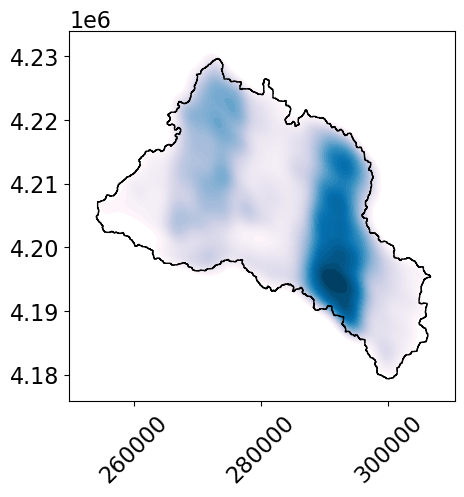

In [84]:
f, ax = plt.subplots()

kde = sns.kdeplot(data='diff_plus', x=atl06sr_gdf.geometry.x, y=atl06sr_gdf.geometry.y, fill=True, legend=True, cmap='PuBu', levels=50, ax=ax)

#plt.colorbar(kde, label='Point Density')

outline_gdf.plot(ax=ax, facecolor='none', edgecolor='k')

plt.xticks(rotation=45)
#plt.title('GLAS Kernel Density Estimator')